In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt

In [12]:
!pip3 install imgaug

     ---------------------------------------- 0.0/948.0 kB ? eta -:--:--
     -- ------------------------------------ 71.7/948.0 kB 2.0 MB/s eta 0:00:01
     ----------- -------------------------- 286.7/948.0 kB 4.4 MB/s eta 0:00:01
     --------------------------- ---------- 675.8/948.0 kB 6.1 MB/s eta 0:00:01
     -------------------------------------- 948.0/948.0 kB 7.5 MB/s eta 0:00:00
  Using cached opencv_python-4.8.1.78-cp37-abi3-win_amd64.whl.metadata (20 kB)
   ---------------------------------------- 0.0/24.5 MB ? eta -:--:--
   - -------------------------------------- 0.8/24.5 MB 26.8 MB/s eta 0:00:01
   -- ------------------------------------- 1.7/24.5 MB 21.5 MB/s eta 0:00:02
   ---- ----------------------------------- 2.5/24.5 MB 22.8 MB/s eta 0:00:01
   ----- ---------------------------------- 3.4/24.5 MB 21.9 MB/s eta 0:00:01
   ------- -------------------------------- 4.5/24.5 MB 23.7 MB/s eta 0:00:01
   -------- ------------------------------- 5.3/24.5 MB 24.2 MB/s et

In [3]:
import matplotlib.image as mpimg
import keras
from keras.models import Sequential

In [10]:
from keras.optimizers import adam_v2
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split


In [17]:
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [25]:
import os
import pandas as pd

datadir = r'C:\Users\aliza\OneDrive\Desktop\Data'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names=columns)

# Set max_colwidth to None
pd.set_option('display.max_colwidth', None)

data.head()


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\aliza\OneDrive\Desktop\Data\IMG\center_2023_12_09_21_49_35_573.jpg,C:\Users\aliza\OneDrive\Desktop\Data\IMG\left_2023_12_09_21_49_35_573.jpg,C:\Users\aliza\OneDrive\Desktop\Data\IMG\right_2023_12_09_21_49_35_573.jpg,0.0,0.0,0.0,0.000080
1,C:\Users\aliza\OneDrive\Desktop\Data\IMG\center_2023_12_09_21_49_35_676.jpg,C:\Users\aliza\OneDrive\Desktop\Data\IMG\left_2023_12_09_21_49_35_676.jpg,C:\Users\aliza\OneDrive\Desktop\Data\IMG\right_2023_12_09_21_49_35_676.jpg,0.0,0.0,0.0,0.000079
2,C:\Users\aliza\OneDrive\Desktop\Data\IMG\center_2023_12_09_21_49_35_778.jpg,C:\Users\aliza\OneDrive\Desktop\Data\IMG\left_2023_12_09_21_49_35_778.jpg,C:\Users\aliza\OneDrive\Desktop\Data\IMG\right_2023_12_09_21_49_35_778.jpg,0.0,0.0,0.0,0.000078
3,C:\Users\aliza\OneDrive\Desktop\Data\IMG\center_2023_12_09_21_49_35_879.jpg,C:\Users\aliza\OneDrive\Desktop\Data\IMG\left_2023_12_09_21_49_35_879.jpg,C:\Users\aliza\OneDrive\Desktop\Data\IMG\right_2023_12_09_21_49_35_879.jpg,0.0,0.0,0.0,0.000079
4,C:\Users\aliza\OneDrive\Desktop\Data\IMG\center_2023_12_09_21_49_35_979.jpg,C:\Users\aliza\OneDrive\Desktop\Data\IMG\left_2023_12_09_21_49_35_979.jpg,C:\Users\aliza\OneDrive\Desktop\Data\IMG\right_2023_12_09_21_49_35_979.jpg,0.0,0.0,0.0,0.000078


In [26]:

def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_12_09_21_49_35_573.jpg,left_2023_12_09_21_49_35_573.jpg,right_2023_12_09_21_49_35_573.jpg,0.0,0.0,0.0,0.000080
1,center_2023_12_09_21_49_35_676.jpg,left_2023_12_09_21_49_35_676.jpg,right_2023_12_09_21_49_35_676.jpg,0.0,0.0,0.0,0.000079
2,center_2023_12_09_21_49_35_778.jpg,left_2023_12_09_21_49_35_778.jpg,right_2023_12_09_21_49_35_778.jpg,0.0,0.0,0.0,0.000078
3,center_2023_12_09_21_49_35_879.jpg,left_2023_12_09_21_49_35_879.jpg,right_2023_12_09_21_49_35_879.jpg,0.0,0.0,0.0,0.000079
4,center_2023_12_09_21_49_35_979.jpg,left_2023_12_09_21_49_35_979.jpg,right_2023_12_09_21_49_35_979.jpg,0.0,0.0,0.0,0.000078


array([-0.96, -0.88, -0.8 , -0.72, -0.64, -0.56, -0.48, -0.4 , -0.32,
       -0.24, -0.16, -0.08,  0.  ,  0.08,  0.16,  0.24,  0.32,  0.4 ,
        0.48,  0.56,  0.64,  0.72,  0.8 ,  0.88,  0.96])

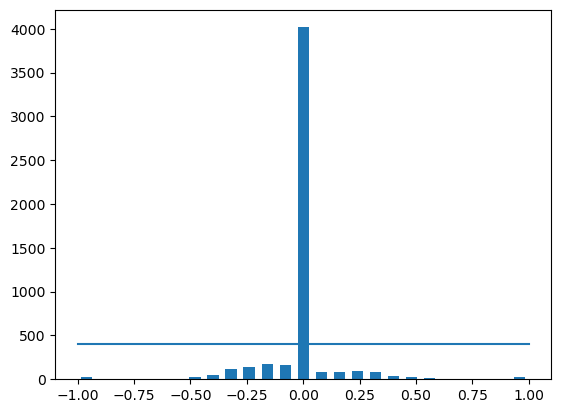

In [27]:

num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))
center

total data: 5165
removed: 3618
remaining: 1547


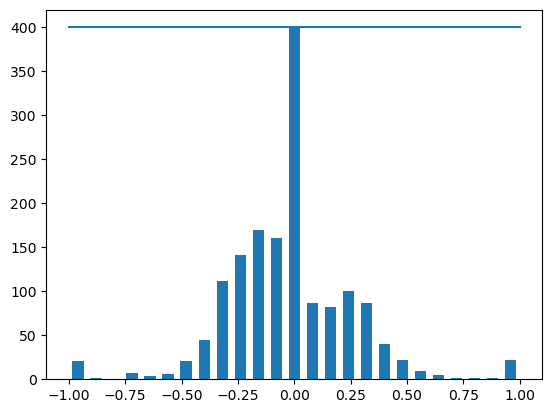

In [28]:
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)
 
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))
 
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [29]:

print(data.iloc[30])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings
 
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2023_12_09_21_49_44_137.jpg
left          left_2023_12_09_21_49_44_137.jpg
right        right_2023_12_09_21_49_44_137.jpg
steering                             -0.066223
throttle                                   1.0
reverse                                    0.0
speed                                 30.18929
Name: 83, dtype: object


C:\Users\aliza\AppData\Local\Temp\ipykernel_25336\612581422.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
C:\Users\aliza\AppData\Local\Temp\ipykernel_25336\612581422.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
C:\Users\aliza\AppData\Local\Temp\ipykernel_25336\612581422.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

Training Samples: 3712
Valid Samples: 929


Text(0.5, 1.0, 'Validation set')

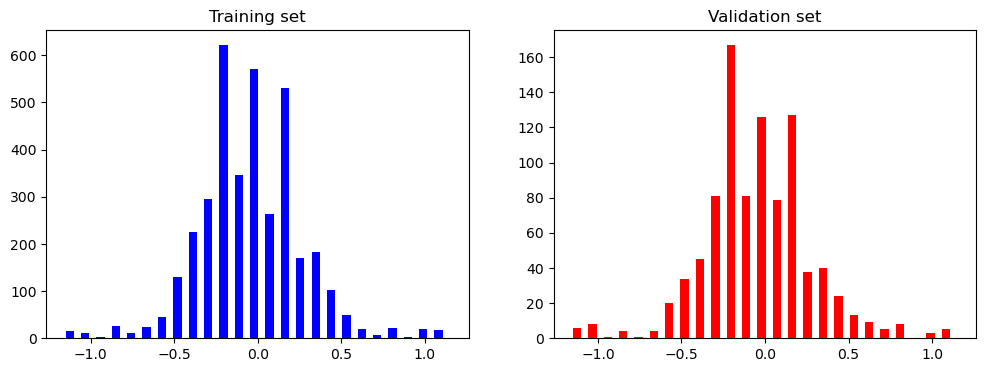

In [30]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

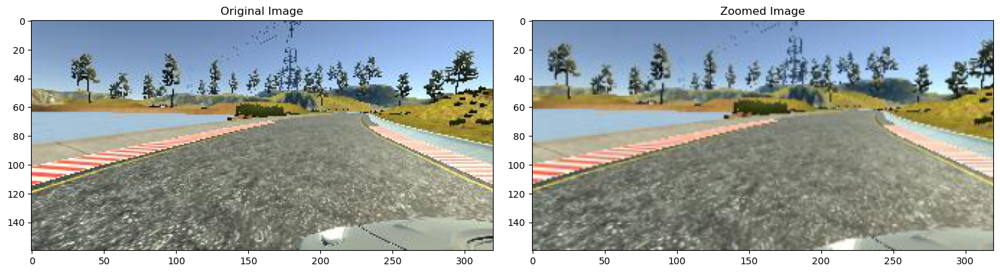

In [31]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.09569579')

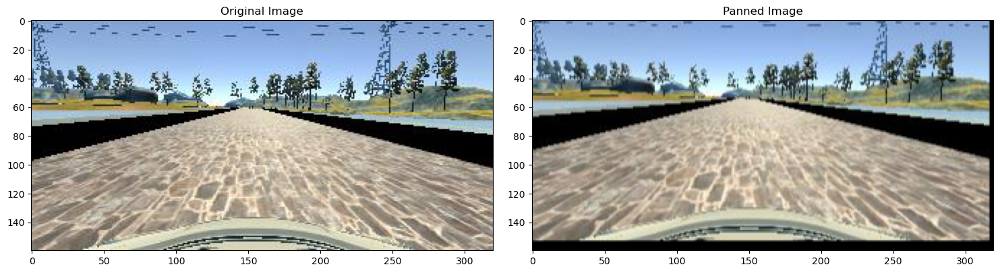

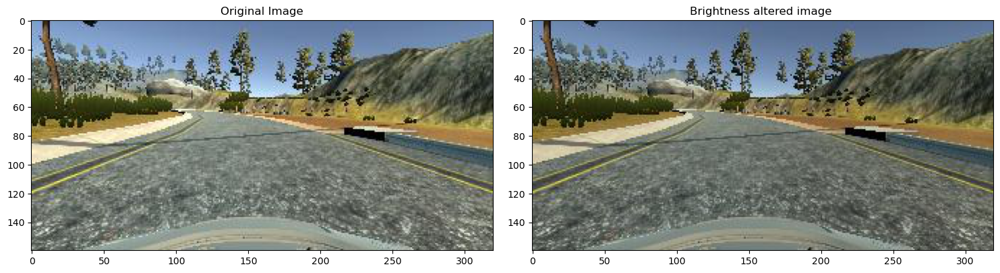

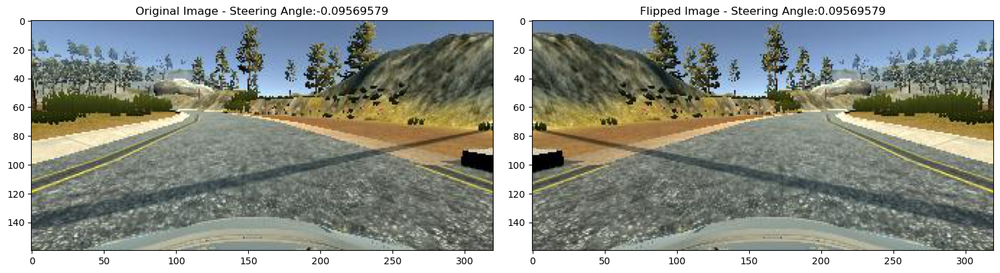

In [32]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
 
 
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))
 
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

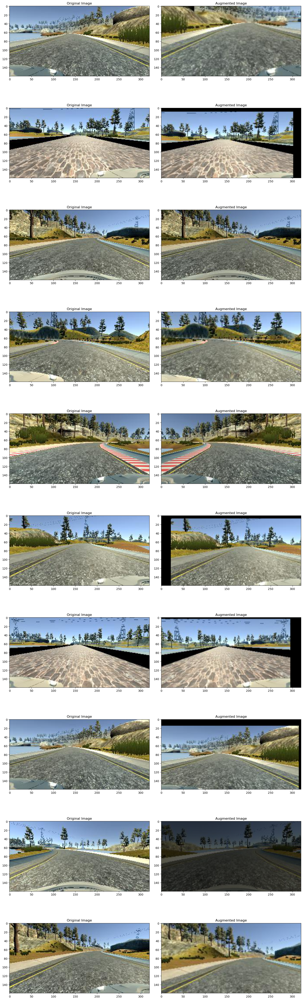

In [33]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    return image, steering_angle
ncol = 2
nrow = 10
 
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
 
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
    
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)
    
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

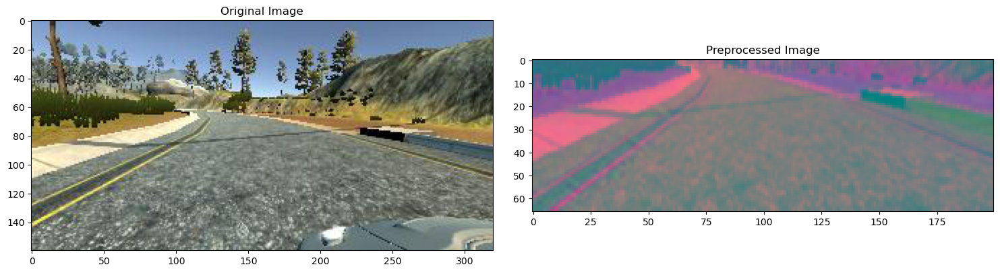

In [34]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

def batch_generator(image_paths, steering_ang, batch_size, istraining):
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
    
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
     
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))  

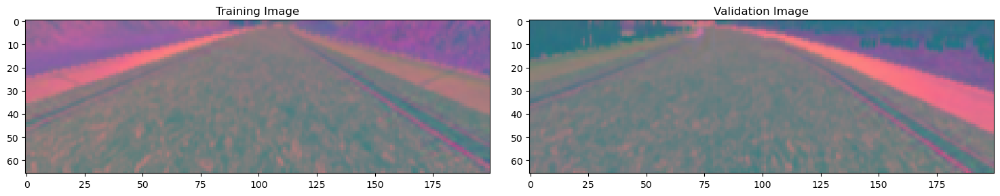

In [35]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
 
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

def nvidia_model():
  model = Sequential()
  model.add(Convolution2D(24, 5, 5, subsample=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Convolution2D(36, 5, 5, subsample=(2, 2), activation='elu'))
  model.add(Convolution2D(48, 5, 5, subsample=(2, 2), activation='elu'))
  model.add(Convolution2D(64, 3, 3, activation='elu'))
  
  model.add(Convolution2D(64, 3, 3, activation='elu'))
#   model.add(Dropout(0.5))
  
  
  model.add(Flatten())
  
  model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))
  
  model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))
  
  model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))
 
  model.add(Dense(1))
  
  optimizer = Adam(lr=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

In [37]:
def nvidia_model():
    model = Sequential()
    model.add(Convolution2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Convolution2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Convolution2D(64, (3, 3), activation='elu'))
    model.add(Convolution2D(64, (3, 3), activation='elu'))
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    model.add(Dense(50, activation='elu'))
    model.add(Dense(10, activation='elu'))
    model.add(Dense(1))
    model.compile(loss='mse', optimizer='adam')
    return model


C:\Users\aliza\AppData\Local\Temp\ipykernel_25336\646689032.py:11: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/10
300/300 [==============================] - 140s 467ms/step - loss: 0.1258 - val_loss: 0.0743
Epoch 2/10
300/300 [==============================] - 118s 393ms/step - loss: 0.0784 - val_loss: 0.0638
Epoch 3/10
300/300 [==============================] - 118s 395ms/step - loss: 0.0662 - val_loss: 0.0507
Epoch 4/10
300/300 [==============================] - 118s 393ms/step - loss: 0.0592 - val_loss: 0.0432
Epoch 5/10
300/300 [==============================] - 117s 392ms/step - loss: 0.0542 - val_loss: 0.0391
Epoch 6/10
300/300 [==============================] - 127s 424ms/step - loss: 0.0502 - val_loss: 0.0375
Epoch 7/10
300/300 [==============================] - 125s 418ms/step - loss: 0.0510 - val_loss: 0.0471
Epoch 8/10
300/300 [==============================] - 119s 397ms/step - loss: 0.0475 - val_loss: 0.0330
Epoch 9/10
300/300 [==============================] - 120s 402ms/step - loss: 0.0462 - val_loss: 0.0373
Epoch 10/10
300/300 [==============================] - 121s 404m

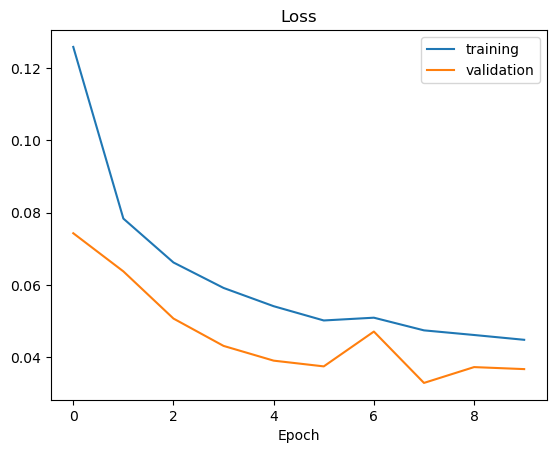

In [46]:
# Import necessary libraries and functions
import matplotlib.pyplot as plt

# Define your model
model = nvidia_model()

# Load or generate your training and validation data
# Assuming you have X_train, y_train, X_valid, y_valid defined

# Train the model and obtain the history
history = model.fit_generator(
    batch_generator(X_train, y_train, 100, 1),
    steps_per_epoch=300,
    epochs=10,
    validation_data=batch_generator(X_valid, y_valid, 100, 0),
    validation_steps=200,
    verbose=1,
    shuffle=1
)

# Plot the loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')
plt.show()

# Save the model
model.save('model.h5')
